##Import

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import sklearn
import itertools
from seaborn.categorical import boxplot
from seaborn.axisgrid import pairplot
from sklearn.preprocessing import MinMaxScaler, Normalizer
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegressionCV
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score, roc_curve
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from pandas import DataFrame
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from keras.models import Sequential
from keras.layers.core import Dense
from sklearn.model_selection import GridSearchCV
from scipy import stats


##Dataset

###Загрузка

In [3]:
x_bp_df = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/X_bp.xlsx', sheet_name='X_bp.csv')
x_nup_df = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/X_nup.xlsx', sheet_name='X_nup.csv')

In [4]:
x_bp_df.head(5)

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [5]:
x_bp_df.info() #info about dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1023 entries, 0 to 1022
Data columns (total 11 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Unnamed: 0                            1023 non-null   float64
 1   Соотношение матрица-наполнитель       1023 non-null   float64
 2   Плотность, кг/м3                      1023 non-null   float64
 3   модуль упругости, ГПа                 1023 non-null   float64
 4   Количество отвердителя, м.%           1023 non-null   float64
 5   Содержание эпоксидных групп,%_2       1023 non-null   float64
 6   Температура вспышки, С_2              1023 non-null   float64
 7   Поверхностная плотность, г/м2         1023 non-null   float64
 8   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 9   Прочность при растяжении, МПа         1023 non-null   float64
 10  Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(11)
me

In [6]:
x_bp_df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,1023.0,511.00,295.46,0.00,255.50,511.00,766.50,1022.00
Соотношение матрица-наполнитель,1023.0,2.93,0.91,0.39,2.32,2.91,3.55,5.59
"Плотность, кг/м3",1023.0,1975.73,73.73,1731.76,1924.16,1977.62,2021.37,2207.77
"модуль упругости, ГПа",1023.0,739.92,330.23,2.44,500.05,739.66,961.81,1911.54
"Количество отвердителя, м.%",1023.0,110.57,28.30,17.74,92.44,110.56,129.73,198.95
"Содержание эпоксидных групп,%_2",1023.0,22.24,2.41,14.25,20.61,22.23,23.96,33.00
"Температура вспышки, С_2",1023.0,285.88,40.94,100.00,259.07,285.90,313.00,413.27
"Поверхностная плотность, г/м2",1023.0,482.73,281.31,0.60,266.82,451.86,693.23,1399.54
"Модуль упругости при растяжении, ГПа",1023.0,73.33,3.12,64.05,71.25,73.27,75.36,82.68
"Прочность при растяжении, МПа",1023.0,2466.92,485.63,1036.86,2135.85,2459.52,2767.19,3848.44


In [7]:
x_bp_df.nunique()

Unnamed: 0                              1023
Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
dtype: int64

In [8]:
x_bp_df.shape

(1023, 11)

In [9]:
x_nup_df.head(5)

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.0,0.0,4.0,57.0
1,1.0,0.0,4.0,60.0
2,2.0,0.0,4.0,70.0
3,3.0,0.0,5.0,47.0
4,4.0,0.0,5.0,57.0


In [10]:
x_nup_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1040 entries, 0 to 1039
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          1040 non-null   float64
 1   Угол нашивки, град  1040 non-null   float64
 2   Шаг нашивки         1040 non-null   float64
 3   Плотность нашивки   1040 non-null   float64
dtypes: float64(4)
memory usage: 32.6 KB


In [11]:
x_nup_df.describe()

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1040.000000,1040.00000,1040.000000,1040.000000
mean,519.500000,45.00000,6.911385,57.248399
std,300.366443,45.02165,2.555181,12.332438
min,0.000000,0.00000,0.000000,0.000000
25%,259.750000,0.00000,5.102256,49.970740
50%,519.500000,45.00000,6.938000,57.413594
75%,779.250000,90.00000,8.587662,65.107235
max,1039.000000,90.00000,14.440522,103.988901


In [12]:
x_nup_df.nunique()

Unnamed: 0            1040
Угол нашивки, град       2
Шаг нашивки           1006
Плотность нашивки     1005
dtype: int64

In [13]:
x_nup_df.shape

(1040, 4)

In [14]:
bp_nup_df = x_bp_df.merge(x_nup_df, left_index=True, right_index=True, how = 'inner')
bp_nup_df.drop(columns = ['Unnamed: 0_x', 'Unnamed: 0_y'], axis = 1, inplace=True)


In [15]:
bp_nup_df.head(20)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.000000,3000.000000,220.0,0.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.000000,3000.000000,220.0,0.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.000000,3000.000000,220.0,0.0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.000000,3000.000000,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.000000,3000.000000,220.0,0.0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.000000,3000.000000,220.0,0.0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.000000,3000.000000,220.0,0.0,5.0,70.0
7,2.561475,1900.0,535.000000,111.86,22.267857,284.615385,380.0,75.000000,1800.000000,120.0,0.0,7.0,47.0
8,3.557018,1930.0,889.000000,129.00,21.250000,300.000000,380.0,75.000000,1800.000000,120.0,0.0,7.0,57.0
9,3.532338,2100.0,1421.000000,129.00,21.250000,300.000000,1010.0,78.000000,2000.000000,300.0,0.0,7.0,60.0


In [16]:
bp_nup_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки      

In [17]:
bp_nup_df.shape

(1023, 13)

In [18]:
bp_nup_df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.93,0.91,0.39,2.32,2.91,3.55,5.59
"Плотность, кг/м3",1023.0,1975.73,73.73,1731.76,1924.16,1977.62,2021.37,2207.77
"модуль упругости, ГПа",1023.0,739.92,330.23,2.44,500.05,739.66,961.81,1911.54
"Количество отвердителя, м.%",1023.0,110.57,28.30,17.74,92.44,110.56,129.73,198.95
"Содержание эпоксидных групп,%_2",1023.0,22.24,2.41,14.25,20.61,22.23,23.96,33.00
"Температура вспышки, С_2",1023.0,285.88,40.94,100.00,259.07,285.90,313.00,413.27
"Поверхностная плотность, г/м2",1023.0,482.73,281.31,0.60,266.82,451.86,693.23,1399.54
"Модуль упругости при растяжении, ГПа",1023.0,73.33,3.12,64.05,71.25,73.27,75.36,82.68
"Прочность при растяжении, МПа",1023.0,2466.92,485.63,1036.86,2135.85,2459.52,2767.19,3848.44
"Потребление смолы, г/м2",1023.0,218.42,59.74,33.80,179.63,219.20,257.48,414.59


In [19]:
#проверяем количество пропусков
bp_nup_df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [20]:
#Проверка дубликатов
bp_nup_df.duplicated().sum()

0

##Гистограммы

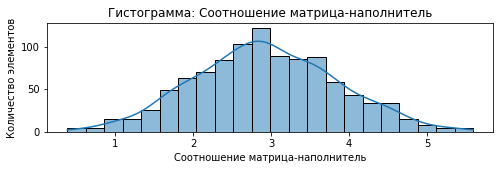

Минимальное значение: 0.389402605178414
Максимальное значение: 5.59174159869754
Среднее значение: 2.9303657734325483
Медианное значение: 2.90687765033521


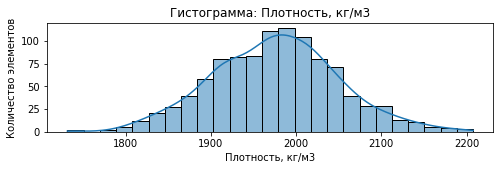

Минимальное значение: 1731.764635096
Максимальное значение: 2207.77348061119
Среднее значение: 1975.7348881101545
Медианное значение: 1977.62165679058


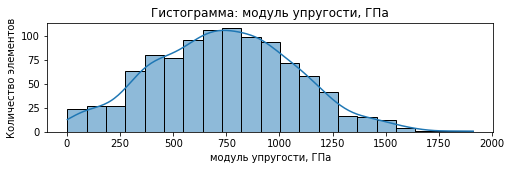

Минимальное значение: 2.4369087535075
Максимальное значение: 1911.53647700054
Среднее значение: 739.9232327560721
Медианное значение: 739.664327697792


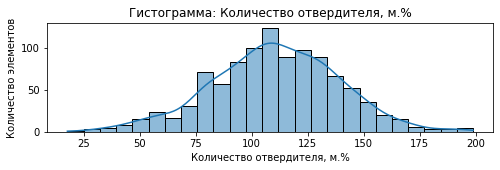

Минимальное значение: 17.7402745562519
Максимальное значение: 198.953207190451
Среднее значение: 110.57076864736254
Медианное значение: 110.564839894065


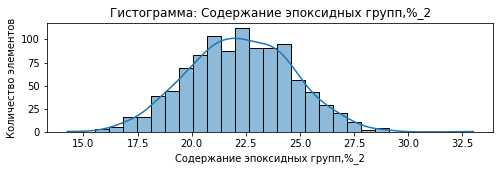

Минимальное значение: 14.2549854977161
Максимальное значение: 33.0
Среднее значение: 22.24438954776773
Медианное значение: 22.2307437560244


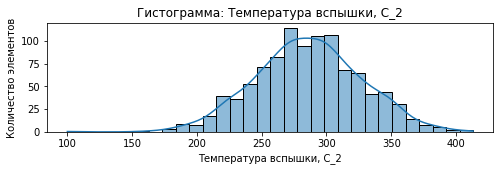

Минимальное значение: 100.0
Максимальное значение: 413.273418243566
Среднее значение: 285.88215135162187
Медианное значение: 285.896812331237


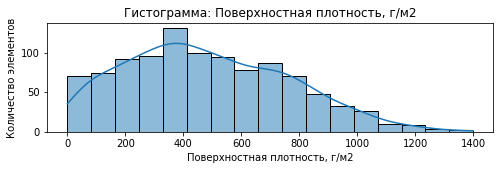

Минимальное значение: 0.603739925153945
Максимальное значение: 1399.54236233989
Среднее значение: 482.73183303841853
Медианное значение: 451.86436518306


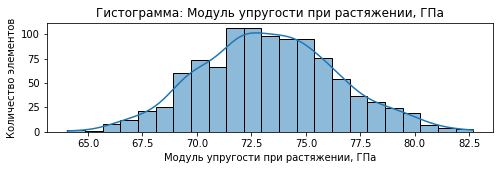

Минимальное значение: 64.0540605597917
Максимальное значение: 82.682051035271
Среднее значение: 73.32857125009068
Медианное значение: 73.2688045943481


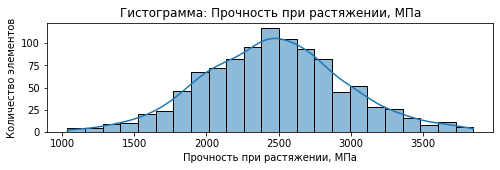

Минимальное значение: 1036.85660535
Максимальное значение: 3848.43673187618
Среднее значение: 2466.922842697902
Медианное значение: 2459.52452600309


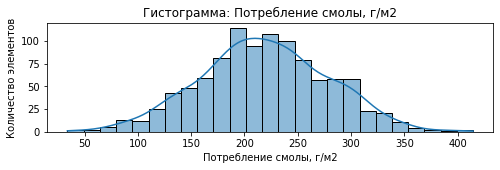

Минимальное значение: 33.8030255329625
Максимальное значение: 414.590628361534
Среднее значение: 218.42314367654285
Медианное значение: 219.198882195134


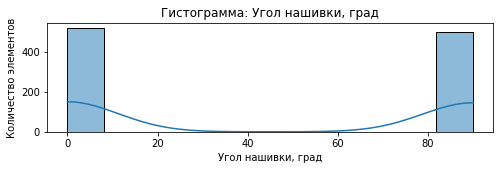

Минимальное значение: 0.0
Максимальное значение: 90.0
Среднее значение: 44.252199413489734
Медианное значение: 0.0


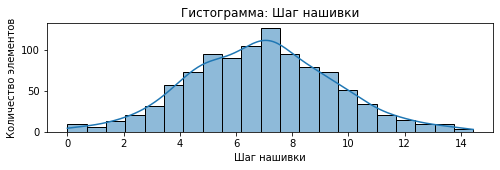

Минимальное значение: 0.0
Максимальное значение: 14.4405218753969
Среднее значение: 6.8992220776750175
Медианное значение: 6.9161438559491


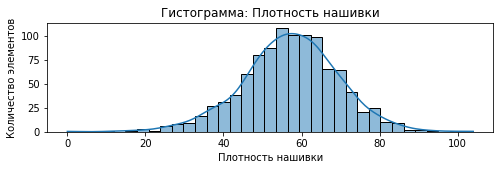

Минимальное значение: 0.0
Максимальное значение: 103.988901301494
Среднее значение: 57.153929432857645
Медианное значение: 57.3419198469929


In [21]:
for col in bp_nup_df.columns:
  plt.figure(figsize=(8,2))
  plt.title('Гистограмма:'+' '+ col)
  plt.ylabel('Количество элементов')
  sns.histplot(data=bp_nup_df[col], kde=True)
  plt.savefig('/content/drive/MyDrive/Colab Notebooks/histogram.pdf')
  plt.show()
  print(f'Минимальное значение: {bp_nup_df[col].min()}')
  print(f'Максимальное значение: {bp_nup_df[col].max()}')
  print(f'Среднее значение: {bp_nup_df[col].mean()}')
  print(f'Медианное значение: {bp_nup_df[col].median()}')
  
  


##Строим ящики с усами

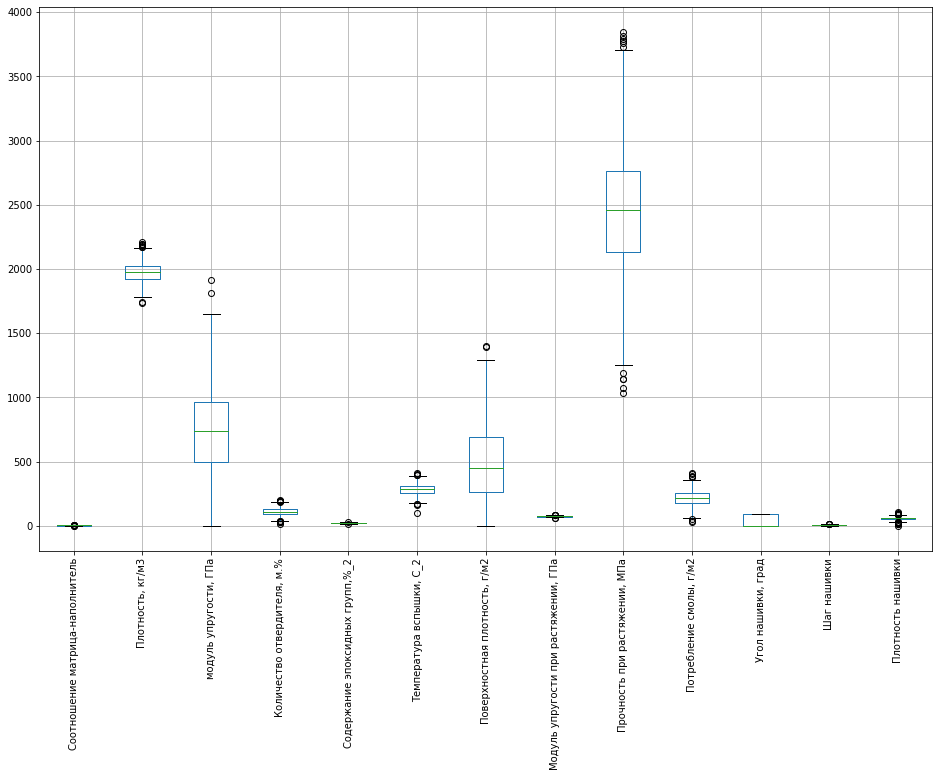

In [22]:
boxplot = bp_nup_df.boxplot(rot=90, figsize=(16, 10))

##Строим графики рассеяния

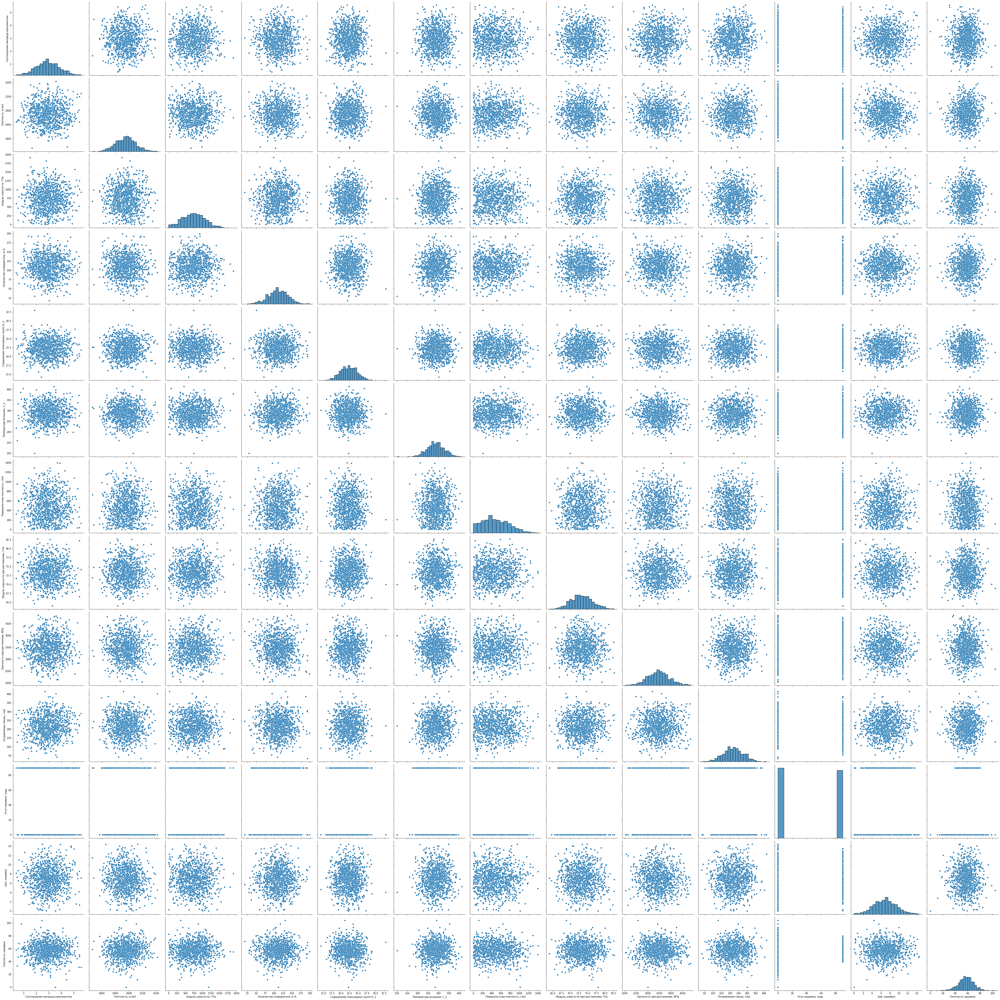

In [23]:
sns.pairplot(bp_nup_df, height=4.5)

##Тепловая картина выбросов

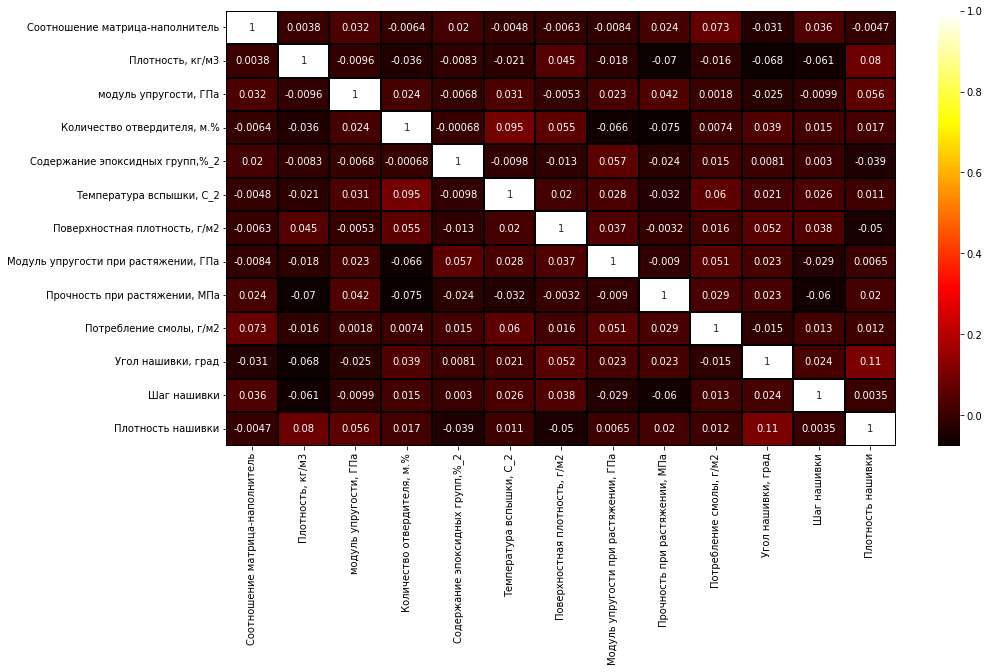

In [24]:
plt.figure(figsize=(15,8))
sns.heatmap(bp_nup_df.corr(), cmap="hot", annot=True, linewidths=1, linecolor='black')

##Среднее значение для каждого параметра

In [25]:
bp_nup_df.mean()

Соотношение матрица-наполнитель            2.930366
Плотность, кг/м3                        1975.734888
модуль упругости, ГПа                    739.923233
Количество отвердителя, м.%              110.570769
Содержание эпоксидных групп,%_2           22.244390
Температура вспышки, С_2                 285.882151
Поверхностная плотность, г/м2            482.731833
Модуль упругости при растяжении, ГПа      73.328571
Прочность при растяжении, МПа           2466.922843
Потребление смолы, г/м2                  218.423144
Угол нашивки, град                        44.252199
Шаг нашивки                                6.899222
Плотность нашивки                         57.153929
dtype: float64

##Медианное значение для каждого параметра

In [26]:
bp_nup_df.median()

Соотношение матрица-наполнитель            2.906878
Плотность, кг/м3                        1977.621657
модуль упругости, ГПа                    739.664328
Количество отвердителя, м.%              110.564840
Содержание эпоксидных групп,%_2           22.230744
Температура вспышки, С_2                 285.896812
Поверхностная плотность, г/м2            451.864365
Модуль упругости при растяжении, ГПа      73.268805
Прочность при растяжении, МПа           2459.524526
Потребление смолы, г/м2                  219.198882
Угол нашивки, град                         0.000000
Шаг нашивки                                6.916144
Плотность нашивки                         57.341920
dtype: float64

In [27]:
bp_nup_df.describe().transpose()[["mean", "std"]]

,mean,std
Соотношение матрица-наполнитель,2.930366,0.913222
"Плотность, кг/м3",1975.734888,73.729231
"модуль упругости, ГПа",739.923233,330.231581
"Количество отвердителя, м.%",110.570769,28.295911
"Содержание эпоксидных групп,%_2",22.244390,2.406301
"Температура вспышки, С_2",285.882151,40.943260
"Поверхностная плотность, г/м2",482.731833,281.314690
"Модуль упругости при растяжении, ГПа",73.328571,3.118983
"Прочность при растяжении, МПа",2466.922843,485.628006
"Потребление смолы, г/м2",218.423144,59.735931


##Предобработка данных

Проведем очистку от выбросов

Рассмотрим 2 способа определения количества выбросов: метод 3 сигм и метод межквартильных расстояний. Выберем способ, при котором наименьшее количество выбросов будет отброшено, поскольку исходя из разведочного анализа данных можно сделать предположение о том, что в смоделированной выборке было слишком мало "реальных" данных. Чтобы эти "реальные" данные (в том числе) не попали в выбросы, постараемся выбросить поменьше

###Метод 3 сигм

In [28]:
count_3s = 0
for colunm in bp_nup_df:
  d = bp_nup_df.loc[:, [colunm]]
  zscore = (bp_nup_df[colunm] - bp_nup_df[colunm].mean()) / bp_nup_df[colunm].std()
  d['3s'] = zscore.abs() > 3
  count_3s += d['3s'].sum()
print('Метод 3 сигм, выбросов:', count_3s)

Метод 3 сигм, выбросов: 24


###Метод межквартильных расстояний

In [29]:
count_iq = 0
for colunm in bp_nup_df:
  d = bp_nup_df.loc[:, [colunm]]
  q1 = np.quantile(bp_nup_df[colunm], 0.25)
  q3 = np.quantile(bp_nup_df[colunm], 0.75)
  iqr = q3 - q1
  lower = q1 - 1.5*iqr
  upper = q3 + 1.5*iqr
  d['iq'] = (bp_nup_df[colunm] <= lower) | (bp_nup_df[colunm] >= upper)
  count_iq += d['iq'].sum()
print('Метод межквартильных расстояний, выбросов:', count_iq)

Метод межквартильных расстояний, выбросов: 93


###Удаляем выбросы методом 3 сигм

In [30]:
clean_outliers_bp_nup_df = bp_nup_df[(np.abs(stats.zscore(bp_nup_df)) <= 3).all(axis=1)]
clean_outliers_bp_nup_df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


In [31]:
clean_outliers_bp_nup_df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,999.0,2.94,0.91,0.39,2.32,2.91,3.55,5.59
"Плотность, кг/м3",999.0,1975.46,72.96,1784.48,1923.71,1977.34,2021.17,2192.74
"модуль упругости, ГПа",999.0,738.45,327.63,2.44,500.05,741.04,959.44,1649.42
"Количество отвердителя, м.%",999.0,110.87,27.83,29.96,92.58,110.69,129.88,192.85
"Содержание эпоксидных групп,%_2",999.0,22.23,2.38,15.70,20.58,22.22,23.98,28.96
"Температура вспышки, С_2",999.0,285.96,40.25,173.48,259.07,285.90,313.03,403.65
"Поверхностная плотность, г/м2",999.0,479.54,277.67,0.60,266.82,450.43,690.82,1291.34
"Модуль упругости при растяжении, ГПа",999.0,73.31,3.10,64.05,71.25,73.22,75.32,82.53
"Прочность при растяжении, МПа",999.0,2465.91,484.14,1036.86,2135.29,2456.40,2760.57,3848.44
"Потребление смолы, г/м2",999.0,218.19,58.94,41.05,179.77,218.45,257.33,386.90


Построим тепловую карту для данных без выбросов, чтобы посмотреть, как изменилась корреляция

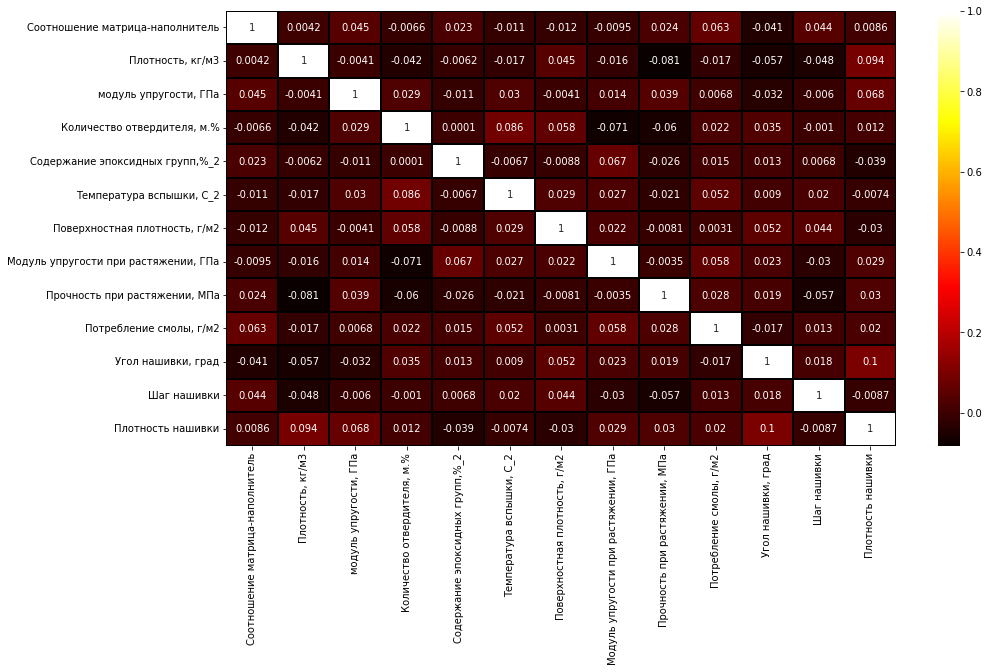

In [32]:
from IPython.core.pylabtools import figsize
corrmat = clean_outliers_bp_nup_df.corr()

f, ax = plt.subplots(figsize=(15,8))
sns.heatmap(corrmat, ax=ax, cmap='hot', annot=True, linewidths=1, linecolor='black')

Видим, что максимальная степень корреляции достигла значения 0.1. Это всё еще очень слабый показатель, свидетельствующий об отсутствии взаимосвязи между параметрами. 

###Нормализация данных

Разброс диапазонов данных

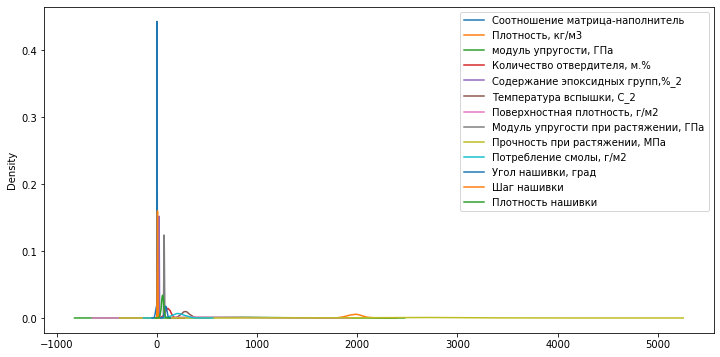

In [33]:
fig, ax = plt.subplots(figsize=(12,6))
clean_outliers_bp_nup_df.plot(kind='kde', ax=ax)

нормализуем

In [34]:
min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(min_max_scaler.fit_transform(clean_outliers_bp_nup_df), columns=clean_outliers_bp_nup_df.columns, index=clean_outliers_bp_nup_df.index)

In [35]:
df_norm

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,0.282131,0.601381,0.447061,0.123047,0.607435,0.482823,0.162230,0.321894,0.698235,0.517418,0.0,0.275109,0.544652
3,0.282131,0.601381,0.447061,0.608021,0.418887,0.549664,0.162230,0.321894,0.698235,0.517418,0.0,0.344539,0.365074
4,0.457857,0.601381,0.455721,0.502800,0.495653,0.482823,0.162230,0.321894,0.698235,0.517418,0.0,0.344539,0.503211
5,0.457201,0.527898,0.452685,0.502800,0.495653,0.482823,0.162230,0.321894,0.698235,0.517418,0.0,0.344539,0.544652
6,0.419084,0.307448,0.488508,0.502800,0.495653,0.482823,0.162230,0.321894,0.698235,0.517418,0.0,0.344539,0.682789
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.361750,0.410540,0.552781,0.350139,0.333908,0.657301,0.161609,0.489229,0.480312,0.242759,1.0,0.627565,0.365347
1019,0.587163,0.650588,0.268550,0.712271,0.294428,0.350746,0.271207,0.480019,0.470745,0.221717,1.0,0.730963,0.458327
1020,0.555750,0.460227,0.251612,0.494656,0.623085,0.325580,0.572959,0.578197,0.578340,0.565435,1.0,0.286298,0.650046
1021,0.637396,0.691520,0.448724,0.684130,0.267818,0.444436,0.496511,0.540754,0.368070,0.451281,1.0,0.435716,0.520631


In [36]:
df_norm.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,999.0,0.49,0.17,0.0,0.37,0.48,0.61,1.0
"Плотность, кг/м3",999.0,0.47,0.18,0.0,0.34,0.47,0.58,1.0
"модуль упругости, ГПа",999.0,0.45,0.20,0.0,0.30,0.45,0.58,1.0
"Количество отвердителя, м.%",999.0,0.50,0.17,0.0,0.38,0.50,0.61,1.0
"Содержание эпоксидных групп,%_2",999.0,0.49,0.18,0.0,0.37,0.49,0.62,1.0
"Температура вспышки, С_2",999.0,0.49,0.17,0.0,0.37,0.49,0.61,1.0
"Поверхностная плотность, г/м2",999.0,0.37,0.22,0.0,0.21,0.35,0.53,1.0
"Модуль упругости при растяжении, ГПа",999.0,0.50,0.17,0.0,0.39,0.50,0.61,1.0
"Прочность при растяжении, МПа",999.0,0.51,0.17,0.0,0.39,0.50,0.61,1.0
"Потребление смолы, г/м2",999.0,0.51,0.17,0.0,0.40,0.51,0.63,1.0


###Графики для нормализованных данных

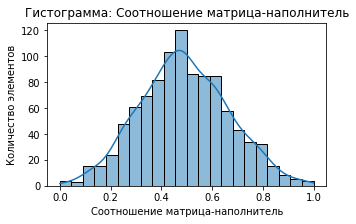

Минимальное значение: 0.0
Максимальное значение: 0.9999999999999998
Среднее значение: 0.48972715878628204
Медианное значение: 0.4842883361597614


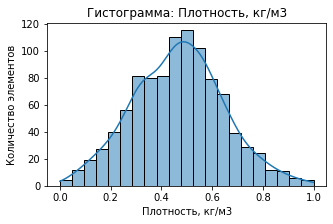

Минимальное значение: 0.0
Максимальное значение: 1.0
Среднее значение: 0.4677980362759108
Медианное значение: 0.4723912146909921


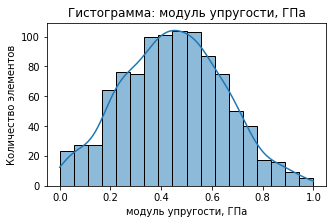

Минимальное значение: 0.0
Максимальное значение: 1.0
Среднее значение: 0.44688691815584913
Медианное значение: 0.44845758224922866


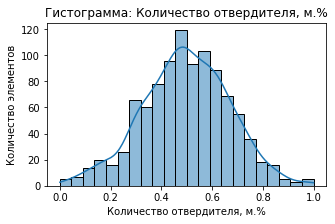

Минимальное значение: 0.0
Максимальное значение: 1.0
Среднее значение: 0.49674725063597797
Медианное значение: 0.4956158951946342


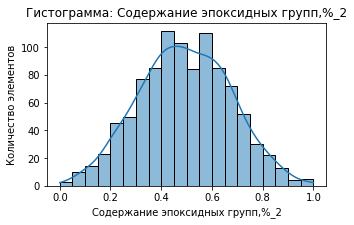

Минимальное значение: 0.0
Максимальное значение: 1.0
Среднее значение: 0.49309726349649696
Медианное значение: 0.4920510501711619


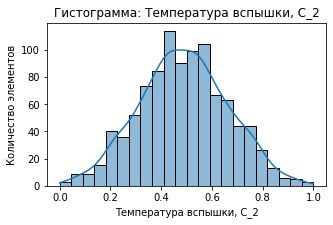

Минимальное значение: 0.0
Максимальное значение: 0.9999999999999999
Среднее значение: 0.4886854847876785
Медианное значение: 0.4883907460859086


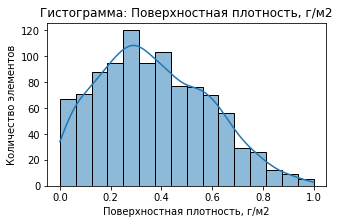

Минимальное значение: 0.0
Максимальное значение: 1.0
Среднее значение: 0.3710581293695378
Медианное значение: 0.34850304741295896


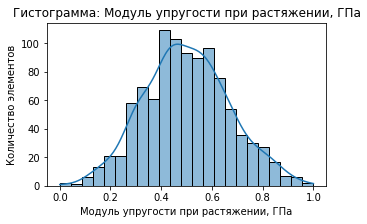

Минимальное значение: 0.0
Максимальное значение: 0.9999999999999996
Среднее значение: 0.5010225155186311
Медианное значение: 0.496176269570777


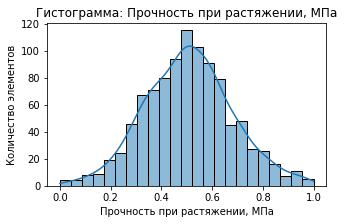

Минимальное значение: 0.0
Максимальное значение: 1.0000000000000002
Среднее значение: 0.5082730920069357
Медианное значение: 0.5048898980034642


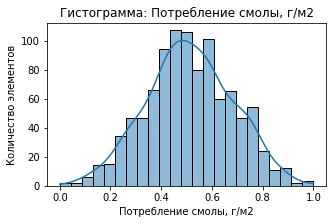

Минимальное значение: 0.0
Максимальное значение: 1.0
Среднее значение: 0.5121817055144455
Медианное значение: 0.5129334967021625


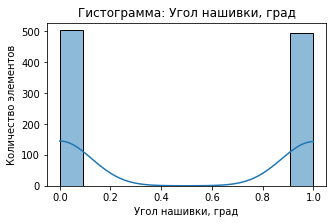

Минимальное значение: 0.0
Максимальное значение: 1.0
Среднее значение: 0.4964964964964965
Медианное значение: 0.0


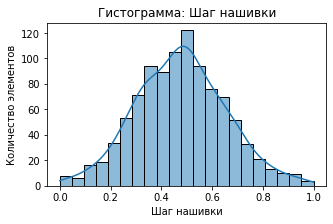

Минимальное значение: 0.0
Максимальное значение: 0.9999999999999999
Среднее значение: 0.47720269950139077
Медианное значение: 0.4784186783066072


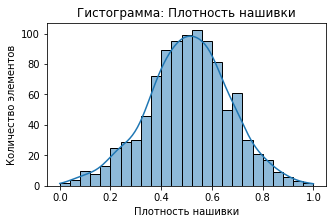

Минимальное значение: 0.0
Максимальное значение: 1.0
Среднее значение: 0.5071322444170501
Медианное значение: 0.5101175113047651


In [37]:
for col in df_norm.columns:
  plt.figure(figsize=(5,3))
  plt.title('Гистограмма:'+ ' ' + col)
  plt.ylabel('Количество элементов')
  sns.histplot(data= df_norm[col], kde=True)
  plt.savefig('/content/drive/MyDrive/Colab Notebooks/Hist_norm.pdf')
  plt.show()
  print(f'Минимальное значение: {df_norm[col].min()}')
  print(f'Максимальное значение: {df_norm[col].max()}')
  print(f'Среднее значение: {df_norm[col].mean()}')
  print(f'Медианное значение: {df_norm[col].median()}')


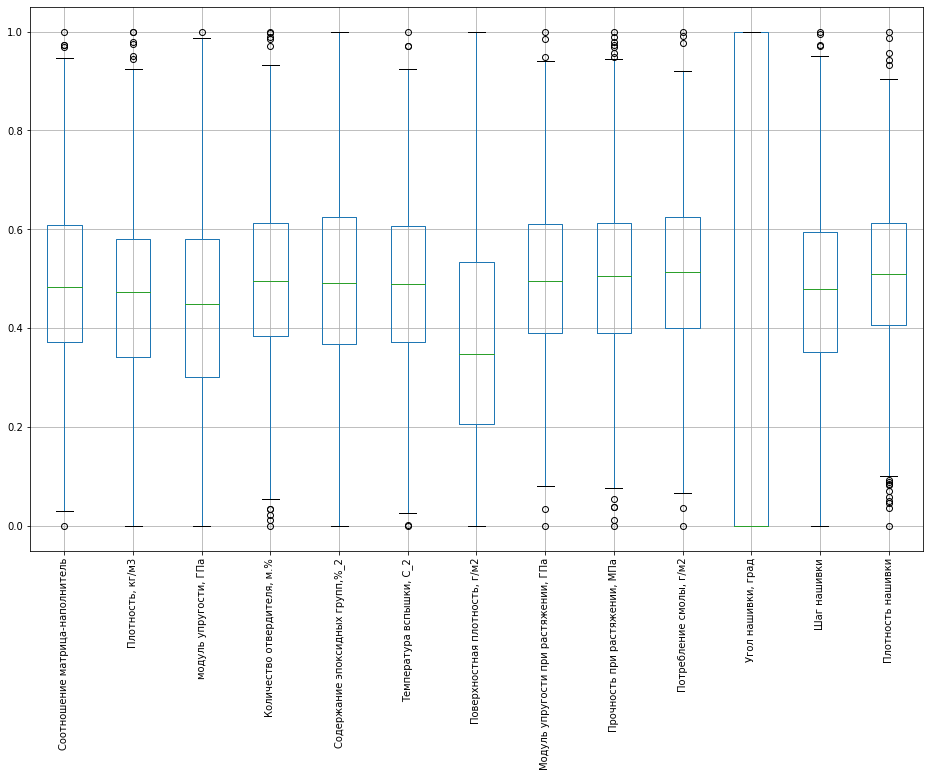

In [38]:
boxplot = df_norm.boxplot(rot=90, figsize=(16,10))

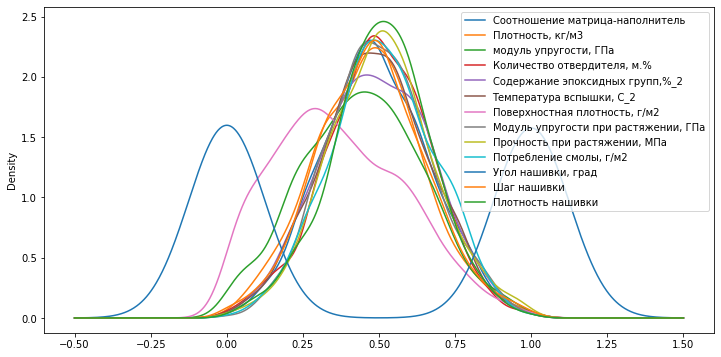

In [39]:
fig, ax = plt.subplots(figsize=(12,6))
df_norm.plot(kind='kde', ax=ax)

In [ ]:
#from matplotlib.backends.backend_pdf import PdfPages

In [ ]:
#pdf = PdfPages("Figures.pdf")

In [ ]:
#pdf.close()

##Обучение моделей для прогноза модуля упругости при растяжении и прочности при растяжении

Определим входные и выходные данные.
Разобъем данные на обучающую и тестовую выборки в соотношении 70/30

In [40]:
x_upr = df_norm.drop(['Модуль упругости при растяжении, ГПа'], axis = 1)
x_pr = df_norm.drop(['Прочность при растяжении, МПа'], axis = 1)
y_upr = df_norm[['Модуль упругости при растяжении, ГПа']]
y_pr = df_norm[['Прочность при растяжении, МПа']]

X_train_upr, X_test_upr, y_train_upr, y_test_upr = train_test_split(x_upr, y_upr, test_size=0.3, random_state=1, shuffle=True)
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(x_pr, y_pr, test_size=0.3, random_state=1, shuffle=True)

размеры тестовой и обучающей выборок для прогноза модуля упругости при растяжении

In [41]:
print('Размер тренировочного датасета на входе:', X_train_upr.shape)
print('Размер тестового датасета на входе:', X_test_upr.shape)
print('Размер тренировочного датасета на выходе:', y_train_upr.shape)
print('Размер тестового датасета на выходе:', y_test_upr.shape)

Размер тренировочного датасета на входе: (699, 12)
Размер тестового датасета на входе: (300, 12)
Размер тренировочного датасета на выходе: (699, 1)
Размер тестового датасета на выходе: (300, 1)


размеры тестовой и обучающей выборок для прогноза прочности при растяжении

In [42]:
print('Размер тренировочного датасета на входе:', X_train_pr.shape)
print('Размер тестового датасета на входе:', X_test_pr.shape)
print('Размер тренировочного датасета на выходе:', y_train_pr.shape)
print('Размер тестового датасета на выходе:', y_test_pr.shape)

Размер тренировочного датасета на входе: (699, 12)
Размер тестового датасета на входе: (300, 12)
Размер тренировочного датасета на выходе: (699, 1)
Размер тестового датасета на выходе: (300, 1)


###Линейная Регрессия

In [43]:
lr = LinearRegression()
lr_params = {
    'fit_intercept' : ['True', 'False']
}
GSCV_lr_upr = GridSearchCV(lr, lr_params, n_jobs=-1, cv=10)
GSCV_lr_upr.fit(X_train_upr, y_train_upr)
GSCV_lr_upr.best_params_

{'fit_intercept': 'True'}

In [44]:
lr_upr = GSCV_lr_upr.best_estimator_
print(f'R2-score LR для модуля упругости при растяжении: {lr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score LR для модуля упругости при растяжении: -0.0


In [45]:
lr_upr_result = pd.DataFrame({
    'Model': 'LinearRegression_upr',
    'MAE': mean_absolute_error(y_test_upr, lr_upr.predict(X_test_upr)),
    'R2 score': lr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [46]:
lr_upr_result

,Model,MAE,R2 score
Модуль упругости при растяжении,LinearRegression_upr,0.131349,-0.0


In [47]:
GSCV_lr_pr = GridSearchCV(lr, lr_params, n_jobs=-1, cv=10)
GSCV_lr_pr.fit(X_train_pr, y_train_pr)
GSCV_lr_pr.best_params_

{'fit_intercept': 'True'}

In [48]:
lr_pr = GSCV_lr_pr.best_estimator_
print(f'R2-score LR для прочности при растяжении: {lr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score LR для прочности при растяжении: -0.025


In [49]:
lr_pr_result = pd.DataFrame({
    'Model': 'LinearRegression_pr',
    'MAE': mean_absolute_error(y_test_pr, lr_pr.predict(X_test_pr)),
    'R2 score': lr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Модуль упругости при растяжении'])

In [50]:
lr_pr_result

,Model,MAE,R2 score
Модуль упругости при растяжении,LinearRegression_pr,0.141692,-0.025


###Метод К ближайших соседей

In [51]:
knr = KNeighborsRegressor()
knr_params = {'n_neighbors': range(1, 301, 5),
              'weights': ['uniform', 'distance'],
              'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
              }
GSCV_knr_upr = GridSearchCV(knr, knr_params, n_jobs=-1, cv=10)
GSCV_knr_upr.fit(X_train_upr, y_train_upr)
GSCV_knr_upr.best_params_

{'algorithm': 'auto', 'n_neighbors': 121, 'weights': 'uniform'}

In [52]:
knr_upr = GSCV_knr_upr.best_estimator_
print(f'R2-score LR для модуля упругости при растяжении: {knr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score LR для модуля упругости при растяжении: 0.004


In [53]:
knr_upr_result = pd.DataFrame({
    'Model': 'KNeighborsRegressor_upr',
    'MAE': mean_absolute_error(y_test_upr, knr_upr.predict(X_test_upr)),
    'R2 score': knr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [54]:
knr_upr_result

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.131265,0.004


In [55]:
GSCV_knr_pr = GridSearchCV(knr, knr_params, n_jobs=-1, cv=10)
GSCV_knr_pr.fit(X_train_pr, y_train_pr)
GSCV_knr_pr.best_params_

{'algorithm': 'brute', 'n_neighbors': 226, 'weights': 'distance'}

In [56]:
knr_pr = GSCV_knr_pr.best_estimator_
print(f'R2-score LR для прочности при растяжении: {knr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score LR для прочности при растяжении: -0.0


In [57]:
knr_pr_result = pd.DataFrame({
    'Model': 'KNeighborsRegressor_pr',
    'MAE': mean_absolute_error(y_test_pr, knr_pr.predict(X_test_pr)),
    'R2 score': knr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Модуль упругости при растяжении'])

In [58]:
knr_pr_result

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_pr,0.138447,-0.0


###Случайный лес

n_estimators - число деревьев в лесу. Будет изменяться от 10 до 990 с шагом 10

max_depth - глубина дерева. Она будет изменяться от 1 до 6 с шагом 2

min_samples_leaf - минимальное число образцов в листах. От 1 до 7

max_samples_split - минимальное число образцов для сплита. От 2 до 9

In [59]:
rfr = RandomForestRegressor()
rfr_params = {
    'n_estimators' : range(10,1000,10),
    'criterion' : ['squared_error', 'absolute_error', 'poisson'],
    'max_depth' : range(1, 7),
    'min_samples_split' : range(20, 50, 5),
    'min_samples_leaf' : range(2, 8),
    'bootstrap' : ['True', 'False']
}
RSCV_rfr_upr = RandomizedSearchCV(rfr, rfr_params, n_jobs=-1, cv=10, verbose=4)
RSCV_rfr_upr.fit(X_train_upr, y_train_upr)
RSCV_rfr_upr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


{'bootstrap': 'True',
 'criterion': 'poisson',
 'max_depth': 2,
 'min_samples_leaf': 5,
 'min_samples_split': 25,
 'n_estimators': 470}

In [60]:
rfr_upr = RSCV_rfr_upr.best_estimator_
print(f'R2-score RFR для модуля упругости при растяжении: {rfr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score RFR для модуля упругости при растяжении: -0.002


In [61]:
rfr_upr_result = pd.DataFrame({
    'Model': 'RandomForestRegressor_upr',
    'MAE': mean_absolute_error(y_test_upr, rfr_upr.predict(X_test_upr)),
    'R2 score': rfr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [62]:
rfr_upr_result

,Model,MAE,R2 score
Модуль упругости при растяжении,RandomForestRegressor_upr,0.131387,-0.002


In [63]:
RSCV_rfr_pr = RandomizedSearchCV(rfr, rfr_params, n_jobs=-1, cv=10, verbose=4)
RSCV_rfr_pr.fit(X_train_pr, y_train_pr)
RSCV_rfr_pr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


{'bootstrap': 'True',
 'criterion': 'squared_error',
 'max_depth': 3,
 'min_samples_leaf': 6,
 'min_samples_split': 20,
 'n_estimators': 380}

In [64]:
rfr_pr = RSCV_rfr_pr.best_estimator_
print(f'R2-score RFR для прочности при растяжении: {rfr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score RFR для прочности при растяжении: -0.007


In [65]:
rfr_pr_result = pd.DataFrame({
    'Model': 'RandomForestRegressor_pr',
    'MAE': mean_absolute_error(y_test_pr, rfr_pr.predict(X_test_pr)),
    'R2 score': rfr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [66]:
rfr_pr_result

,Model,MAE,R2 score
Прочность при растяжении,RandomForestRegressor_pr,0.139178,-0.007


Если коэффициент R2=0, то это означает, что модель прогнозирует данные с таким же результатом, как если бы мы всегда брали среднее значение прогнозируемой переменной. Если R2<0, это означает, что разработанная модель даёт прогноз даже хуже, чем простое усреднение. Очевидно, что ни одна из моделей не справляется с поставленной задачей.


##Поиск гиперпараметров

график модели линейная регрессия

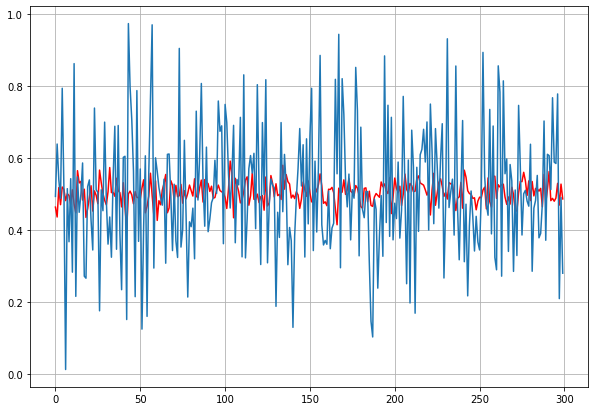

In [67]:
lr = LinearRegression()
lr.fit(X_train_pr, y_train_pr)
y_pred_lr = lr.predict(X_test_pr)
plt.figure(figsize=(10,7))
plt.plot(y_pred_lr, "r", label="Prediction")
plt.plot(y_test_pr.values, label="Prediction")
plt.grid(True)

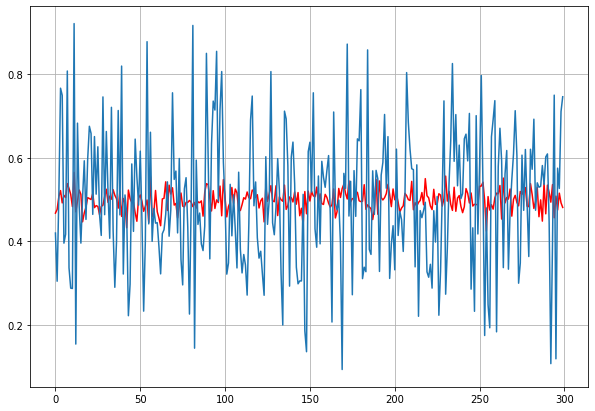

In [68]:
lr = LinearRegression()
lr.fit(X_train_upr, y_train_upr)
y_pred_lr = lr.predict(X_test_upr)
plt.figure(figsize=(10,7))
plt.plot(y_pred_lr, "r", label="Prediction")
plt.plot(y_test_upr.values, label="Prediction")
plt.grid(True)

График модели К ближайших соседей

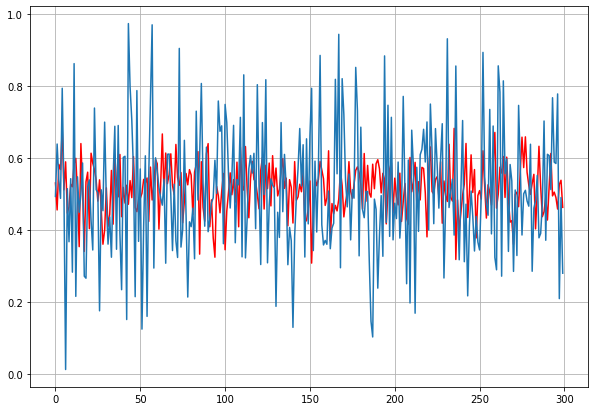

In [69]:
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train_pr, y_train_pr)
y_pred_knn = knn.predict(X_test_pr)
plt.figure(figsize(10,7))
plt.plot(y_pred_knn, "r", label="Prediction")
plt.plot(y_test_pr.values, label="Prediction")
plt.grid(True)

Поиск лучших гиперпараметров

In [70]:
param_grid = {"n_neighbors": range(1,50)}
gs = GridSearchCV(knn, param_grid, cv=10, verbose = 1, n_jobs=-1)
gs.fit(X_train_pr, y_train_pr)
knn_3 = gs.best_estimator_
gs.best_params_

Fitting 10 folds for each of 49 candidates, totalling 490 fits


{'n_neighbors': 39}

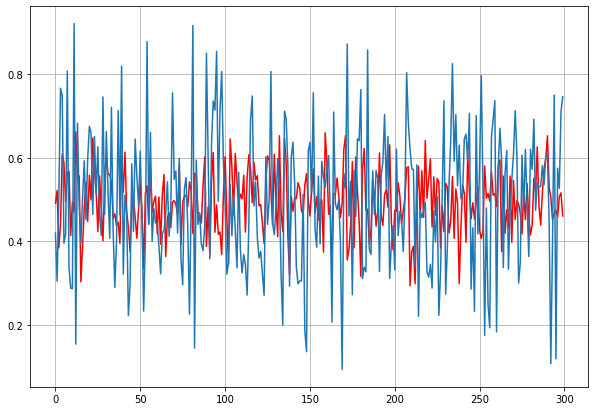

In [71]:
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train_upr, y_train_upr)
y_pred_knn = knn.predict(X_test_upr)
plt.figure(figsize(10,7))
plt.plot(y_pred_knn, "r", label="Prediction")
plt.plot(y_test_upr.values, label="Prediction")
plt.grid(True)

Поиск лучших гиперпараметров

In [73]:
param_grid = {"n_neighbors": range(1,50)}
gs = GridSearchCV(knn, param_grid, cv=10, verbose = 1, n_jobs=-1)
gs.fit(X_train_upr, y_train_upr)
knn_3 = gs.best_estimator_
gs.best_params_

Fitting 10 folds for each of 49 candidates, totalling 490 fits


{'n_neighbors': 47}

#График модели случайный лес

In [75]:
n_estimators = [5,7,9,11,15,20,40]
max_depth = [1,2,3,4,5]
min_samples_split = [23,24,25,26]
min_samples_leaf = [3,4,5,6]
bootstrap = [True]
param_grid = {'n_estimators': n_estimators,
              'max_depth': max_depth,
              'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf,
              'bootstrap': bootstrap}
gs = GridSearchCV(RandomForestRegressor(), param_grid, cv=10, verbose=1, n_jobs=-1)
gs.fit(X_train_pr, y_train_pr)
rfr_3 = gs.best_estimator_
gs.best_params_

Fitting 10 folds for each of 560 candidates, totalling 5600 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


{'bootstrap': True,
 'max_depth': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 24,
 'n_estimators': 11}

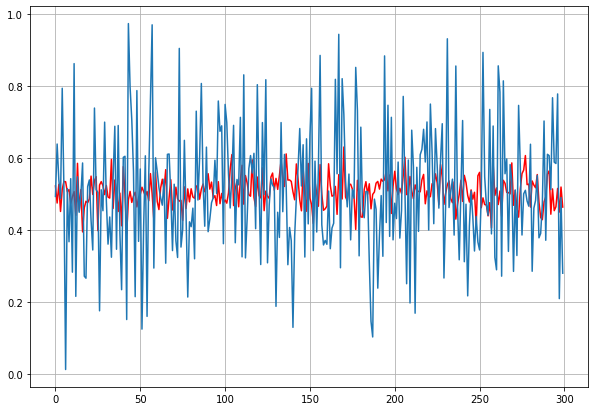

In [76]:
rfr = RandomForestRegressor(n_estimators=1000, max_depth=18)
rfr.fit(X_train_pr, y_train_pr.values[:, 0])
y_pred_pr_forest = rfr.predict(X_test_pr)
plt.figure(figsize(10,7))
plt.plot(y_pred_pr_forest, "r", label="Prediction")
plt.plot(y_test_pr.values, label="Prediction")
plt.grid(True)

Поиск лучших гиперпараметров

In [77]:
n_estimators = [5,7,9,11,15,20,40]
max_depth = [1,2,3,4,5]
min_samples_split = [23,24,25,26]
min_samples_leaf = [3,4,5,6]
bootstrap = [True]
param_grid = {'n_estimators': n_estimators,
              'max_depth': max_depth,
              'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf,
              'bootstrap': bootstrap}
gs = GridSearchCV(RandomForestRegressor(), param_grid, cv=10, verbose=1, n_jobs=-1)
gs.fit(X_train_upr, y_train_upr)
rfr_3 = gs.best_estimator_
gs.best_params_

Fitting 10 folds for each of 560 candidates, totalling 5600 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:926: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


{'bootstrap': True,
 'max_depth': 1,
 'min_samples_leaf': 6,
 'min_samples_split': 24,
 'n_estimators': 5}

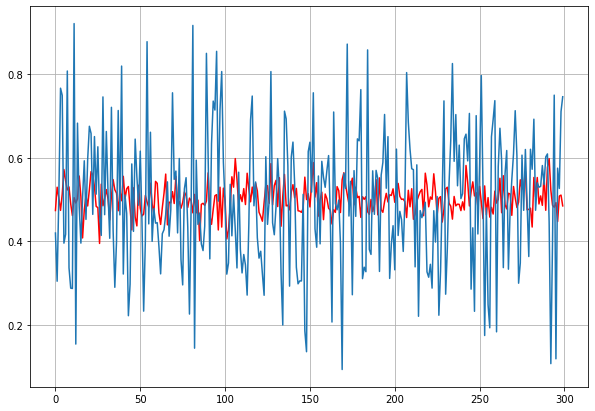

In [78]:
rfr = RandomForestRegressor(n_estimators=1000, max_depth=18)
rfr.fit(X_train_upr, y_train_upr.values[:, 0])
y_pred_upr_forest = rfr.predict(X_test_upr)
plt.figure(figsize(10,7))
plt.plot(y_pred_upr_forest, "r", label="Prediction")
plt.plot(y_test_upr.values, label="Prediction")
plt.grid(True)

##Написание нейронной сети, которая будет рекомендовать соотношение матрица-наполнитель

In [79]:
input_columns_names = ["Модуль упругости при растяжении, ГПа",
                       "Прочность при растяжении, МПа",
                       "Плотность, кг/м3",
                       "модуль упругости, ГПа",
                       "Количество отвердителя, м.%",
                       "Содержание эпоксидных групп,%_2",
                       "Температура вспышки, С_2",
                       "Поверхностная плотность, г/м2",
                       "Потребление смолы, г/м2",
                       "Угол нашивки, град",
                       "Шаг нашивки",
                       "Плотность нашивки"]
output_columns_names = ["Соотношение матрица-наполнитель"]

X = df_norm[input_columns_names]
y = df_norm[output_columns_names]

Делим выборку на тестовую и обучающую в соотношении 70/30

In [81]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, shuffle=True)
knn = KNeighborsRegressor()
param_grid = {
    'n_neighbors': [1, 2, 5, 10, 20]
}
GSCV = GridSearchCV(estimator=knn, param_grid=param_grid, cv=10, verbose=1)
GSCV.fit(X_train, y_train)
GSCV.best_params_

Fitting 10 folds for each of 5 candidates, totalling 50 fits


{'n_neighbors': 20}

In [82]:
knn.fit(X_train, y_train)
prediction = knn.predict(X_test)
np.mean((y_test - prediction)*(y_test - prediction))


Соотношение матрица-наполнитель    0.038676
dtype: float64

##Построение Нейронной сети для рекомендации соотношения матрица-наполнитель

In [83]:
input_columns_names = ["Плотность, кг/м3",
                       "модуль упругости, ГПа",
                       "Количество отвердителя, м.%",
                       "Содержание эпоксидных групп,%_2",
                       "Температура вспышки, С_2",
                       "Поверхностная плотность, г/м2",
                       "Потребление смолы, г/м2",
                       "Угол нашивки, град",
                       "Шаг нашивки",
                       "Плотность нашивки"]
output_columns_names = ["Соотношение матрица-наполнитель"]

X = df_norm[input_columns_names]
y = df_norm[output_columns_names]

In [84]:
print(X.shape, y.shape)

(999, 10) (999, 1)


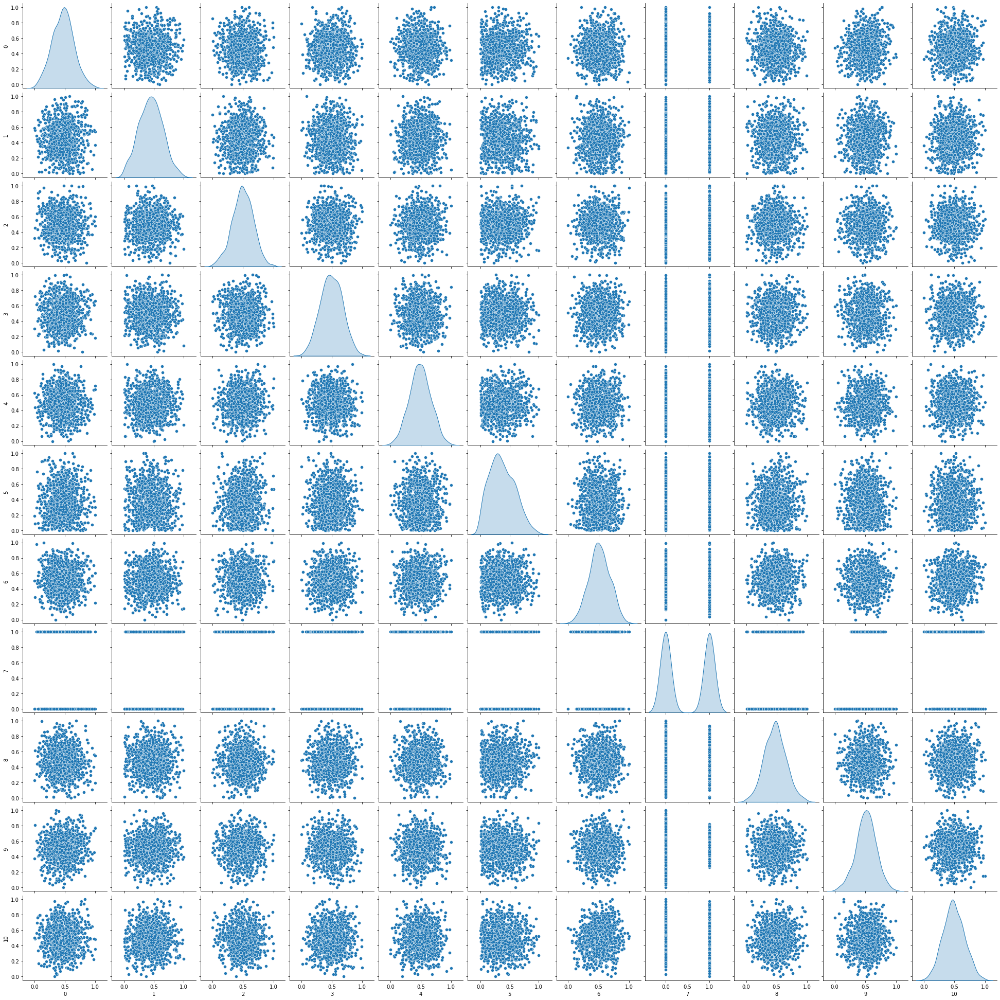

In [85]:
sns.pairplot(pd.DataFrame(np.column_stack([X, y])), diag_kind="kde")


In [86]:
pd.DataFrame(np.column_stack([X, y]))

,0,1,2,3,4,5,6,7,8,9,10
0,0.601381,0.447061,0.123047,0.607435,0.482823,0.162230,0.517418,0.0,0.275109,0.544652,0.282131
1,0.601381,0.447061,0.608021,0.418887,0.549664,0.162230,0.517418,0.0,0.344539,0.365074,0.282131
2,0.601381,0.455721,0.502800,0.495653,0.482823,0.162230,0.517418,0.0,0.344539,0.503211,0.457857
3,0.527898,0.452685,0.502800,0.495653,0.482823,0.162230,0.517418,0.0,0.344539,0.544652,0.457201
4,0.307448,0.488508,0.502800,0.495653,0.482823,0.162230,0.517418,0.0,0.344539,0.682789,0.419084
...,...,...,...,...,...,...,...,...,...,...,...
994,0.410540,0.552781,0.350139,0.333908,0.657301,0.161609,0.242759,1.0,0.627565,0.365347,0.361750
995,0.650588,0.268550,0.712271,0.294428,0.350746,0.271207,0.221717,1.0,0.730963,0.458327,0.587163
996,0.460227,0.251612,0.494656,0.623085,0.325580,0.572959,0.565435,1.0,0.286298,0.650046,0.555750
997,0.691520,0.448724,0.684130,0.267818,0.444436,0.496511,0.451281,1.0,0.435716,0.520631,0.637396


Добавляем полносвязный слой 32т нейрона, еще один слой 64 нейрона оптимизатор адам, активация релу

In [87]:
from keras.models import Sequential
from keras import models

In [88]:
def get_model(n_inputs, n_outputs):
  model = Sequential()
  model.add(Dense(32, input_dim=n_inputs, kernel_initializer="he_uniform", activation="relu"))
  model.add(Dense(64, input_dim=n_inputs, kernel_initializer="he_uniform", activation="relu"))
  model.add(Dense(n_outputs))
  model.compile(loss="mse", optimizer="adam")
  return model


Сначала подаются инпуты на входной слой

In [89]:
model = get_model(10, 1)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                352       
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 2,529
Trainable params: 2,529
Non-trainable params: 0
_________________________________________________________________


In [90]:
hist = model.fit(X, y, verbose=1, epochs=70)
#  plt.plot(hist.history['accuracy'],
#          label = 'Точность train')
#  plt.plot(hist.history['val_accuracy'],
#          label = 'Точность тест')
#  plt.xlabel('эпоха')
#  plt.ylabel('точность')
#  plt.legend()
#  plt.show()

Epoch 1/70
32/32 [==============================] - 1s 1ms/step - loss: 0.0995
Epoch 2/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0492
Epoch 3/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0397
Epoch 4/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0368
Epoch 5/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0353
Epoch 6/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0341
Epoch 7/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0342
Epoch 8/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0338
Epoch 9/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0333
Epoch 10/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0330
Epoch 11/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0318
Epoch 12/70
32/32 [==============================] - 0s 1ms/step - loss: 0.0312
Epoch 13/70
32/32 [==============================

In [91]:
df = pd.DataFrame(hist.history)

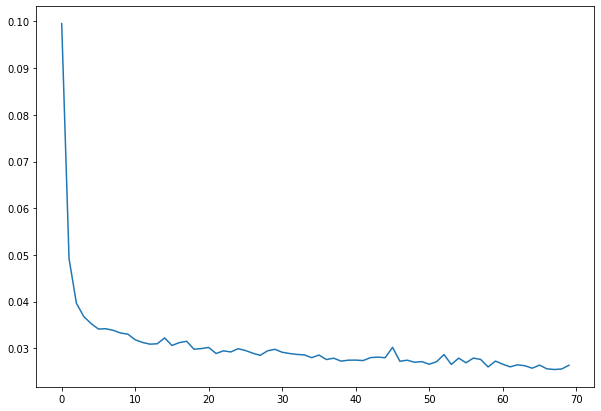

In [92]:
plt.plot(df)


In [93]:
X

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,0.601381,0.447061,0.123047,0.607435,0.482823,0.162230,0.517418,0.0,0.275109,0.544652
3,0.601381,0.447061,0.608021,0.418887,0.549664,0.162230,0.517418,0.0,0.344539,0.365074
4,0.601381,0.455721,0.502800,0.495653,0.482823,0.162230,0.517418,0.0,0.344539,0.503211
5,0.527898,0.452685,0.502800,0.495653,0.482823,0.162230,0.517418,0.0,0.344539,0.544652
6,0.307448,0.488508,0.502800,0.495653,0.482823,0.162230,0.517418,0.0,0.344539,0.682789
...,...,...,...,...,...,...,...,...,...,...
1018,0.410540,0.552781,0.350139,0.333908,0.657301,0.161609,0.242759,1.0,0.627565,0.365347
1019,0.650588,0.268550,0.712271,0.294428,0.350746,0.271207,0.221717,1.0,0.730963,0.458327
1020,0.460227,0.251612,0.494656,0.623085,0.325580,0.572959,0.565435,1.0,0.286298,0.650046
1021,0.691520,0.448724,0.684130,0.267818,0.444436,0.496511,0.451281,1.0,0.435716,0.520631


In [94]:
prediction = model.predict(X)

In [95]:
prediction

array([[0.5365406 ],
       [0.4790597 ],
       [0.49574962],
       [0.4954062 ],
       [0.4636081 ],
       [0.5089025 ],
       [0.54313433],
       [0.56865793],
       [0.65503275],
       [0.42383847],
       [0.51473033],
       [0.5133809 ],
       [0.55457515],
       [0.5737973 ],
       [0.6135256 ],
       [0.55058366],
       [0.5767832 ],
       [0.4336959 ],
       [0.56619537],
       [0.60438925],
       [0.5508358 ],
       [0.5798872 ],
       [0.52913445],
       [0.4685641 ],
       [0.54148316],
       [0.5612811 ],
       [0.59474015],
       [0.45323318],
       [0.51398426],
       [0.6069568 ],
       [0.543021  ],
       [0.5793294 ],
       [0.53633976],
       [0.5186167 ],
       [0.5378222 ],
       [0.5034792 ],
       [0.6120952 ],
       [0.45951676],
       [0.57568926],
       [0.32287794],
       [0.6491073 ],
       [0.5934594 ],
       [0.48573655],
       [0.45539296],
       [0.46920896],
       [0.5422721 ],
       [0.5556658 ],
       [0.569

In [96]:
np.mean(np.abs((y-prediction)), axis=0)

Соотношение матрица-наполнитель    0.13034
dtype: float64

In [97]:
np.abs(y-prediction)

,Соотношение матрица-наполнитель
1,0.254410
3,0.196929
4,0.037892
5,0.038205
6,0.044524
...,...
1018,0.148223
1019,0.021833
1020,0.028724
1021,0.053123


In [98]:
np.mean((y-prediction)*(y-prediction), axis=0)

Соотношение матрица-наполнитель    0.026325
dtype: float64